In [78]:
import scanpy as sc
import pandas as pd
import glob,numpy as np

In [92]:
iset=1
fls = glob.glob(rf'Z:\MERFISHp\12_16_2025_BigSlideTest\final_mats\*zscan{iset}_*mat.npz')
len(fls)

129

In [93]:

Mcells = []
Mcounts = []
Xcells = []
from tqdm import tqdm
for spot_fl in tqdm(fls):
    dic = np.load(spot_fl)
    Mgenes = dic['Mgenes']
    Mcells_ = dic['Mcells']
    Mcounts_ = dic['Mcounts']
    Xum = dic['Xum']
    Xcells.append(Xum)
    Mcells.append(Mcells_)
    Mcounts.append(Mcounts_)
Mcells = np.concatenate(Mcells)
Mcounts = np.concatenate(Mcounts)
Xcells = np.concatenate(Xcells)

100%|████████████████████████████████████████████████████████████████████████████████| 129/129 [00:30<00:00,  4.16it/s]


In [94]:

pix_size=[0.4,0.108333,0.108333]
import pickle, numpy as np
dic_pos = pickle.load(open(r'Z:\MERFISHp\12_16_2025_BigSlideTest\dic_pos_pixf.pkl','rb'))
Xm = np.min([dic_pos[fov]for fov in dic_pos if f'zscan{iset}_' in fov],axis=0)
pos = (np.array([dic_pos[cell.split('--')[0]]for cell in Mcells])-Xm)*pix_size[1:]
Xcellsf = Xcells.copy()
#Xcellsf[:,1:]=Xcellsf[:,1:]+pos
posU = []
ifov = []
for p in pos:
    p_ = tuple(p)
    if p_ not in posU:
        posU.append(p_)
    ifov.append(posU.index(p_))
ifov = np.array(ifov)
posU = np.array(posU)
#np.round(np.diff(posU,axis=0)).astype(int)
posU_ = posU+2800*pix_size[-1]/2
from scipy.spatial import KDTree
dd,ii = KDTree(posU_).query(Xcellsf[:,1:],p=np.inf)
Mcells = Mcells[ii==ifov]
Mcounts = Mcounts[ii==ifov]
Xcellsf=Xcellsf[ii==ifov]


In [95]:
import napari
napari.view_points(Xcellsf[:,1:],size=10)

C:\Users\miket\AppData\Local\Temp\ipykernel_35364\4011631030.py:2: FutureWarning: `napari.view_points` is deprecated and will be removed in napari 0.7.0.
Use `viewer = napari.Viewer(); viewer.add_points(...)` instead.
  napari.view_points(Xcellsf[:,1:],size=10)


Viewer(camera=Camera(center=(0.0, np.float64(2174.067385261617), np.float64(1679.1814904702164)), zoom=np.float64(0.18268449844258317), angles=(0.0, 0.0, 90.0), perspective=0.0, mouse_pan=True, mouse_zoom=True, orientation=(<DepthAxisOrientation.TOWARDS: 'towards'>, <VerticalAxisOrientation.DOWN: 'down'>, <HorizontalAxisOrientation.RIGHT: 'right'>)), cursor=Cursor(position=(1.0, 1.0), viewbox=None, scaled=True, style=<CursorStyle.STANDARD: 'standard'>, size=1.0), dims=Dims(ndim=2, ndisplay=2, order=(0, 1), axis_labels=('0', '1'), rollable=(True, True), range=(RangeTuple(start=np.float64(116.79686018382274), stop=np.float64(4231.337910339411), step=np.float64(1.0)), RangeTuple(start=np.float64(124.11480484733046), stop=np.float64(3234.2481760931023), step=np.float64(1.0))), margin_left=(0.0, 0.0), margin_right=(0.0, 0.0), point=(np.float64(2173.796860183823), np.float64(1679.1148048473306)), last_used=0), grid=GridCanvas(stride=1, shape=(-1, -1), enabled=False, spacing=0.0), layers=[<Po

In [96]:
keep_gn = np.array(['blank' not in gn for gn in Mgenes])
df = pd.DataFrame(Mcounts[:,keep_gn],index=Mcells,columns=Mgenes[keep_gn])
df_blank = pd.DataFrame(Mcounts[:,~keep_gn],index=Mcells,columns=Mgenes[~keep_gn])
scdata = sc.AnnData(df)
scdata.obsm['X_spatial'] = Xcellsf
scdata.obsm['X_spatial'] = Xcellsf
scdata.obsm['X_raw']=scdata.X.copy()
scdata.obsm['X_blank']=df_blank

sc.pp.calculate_qc_metrics(scdata, percent_top=None, inplace=True)
sc.pp.normalize_total(scdata, target_sum=np.median(scdata.obs["total_counts"]))
sc.pp.log1p(scdata)
tot_counts = np.array(scdata.obs["total_counts"])
tot_counts = tot_counts[(~np.isinf(tot_counts))&(~np.isnan(tot_counts))]


C:\Users\miket\.conda\envs\merfishplus\lib\site-packages\legacy_api_wrap\__init__.py:88: UserWarning: Some cells have zero counts
  return fn(*args_all, **kw)


Number of transcripts per cell (10 percentile): 599.0
Median number of transcripts per cell: 3957.0


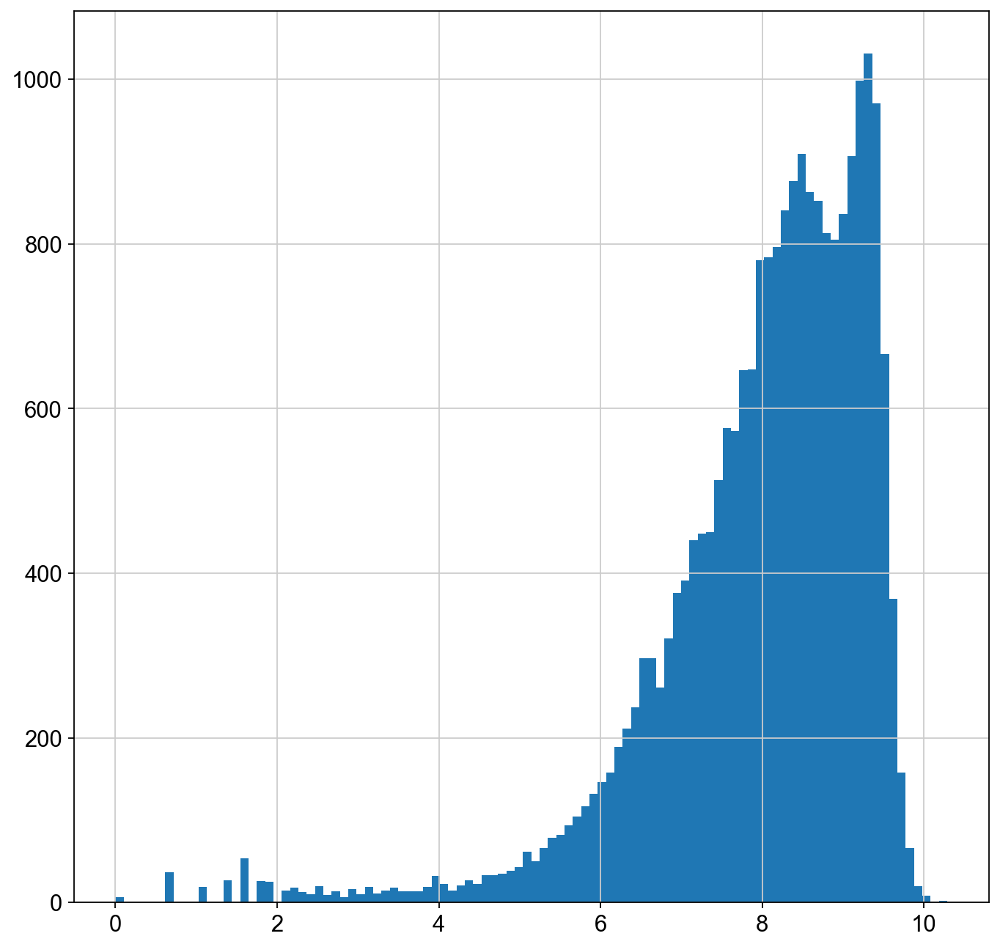

In [97]:
import matplotlib.pylab as plt
plt.hist(np.log1p(tot_counts),bins=100);
print("Number of transcripts per cell (10 percentile):",np.percentile(tot_counts,10))
print("Median number of transcripts per cell:",np.percentile(tot_counts,50))

(np.float64(55.45915904048087),
 np.float64(4245.1244937586525),
 np.float64(-31.39186371495815),
 np.float64(3389.754844655391))

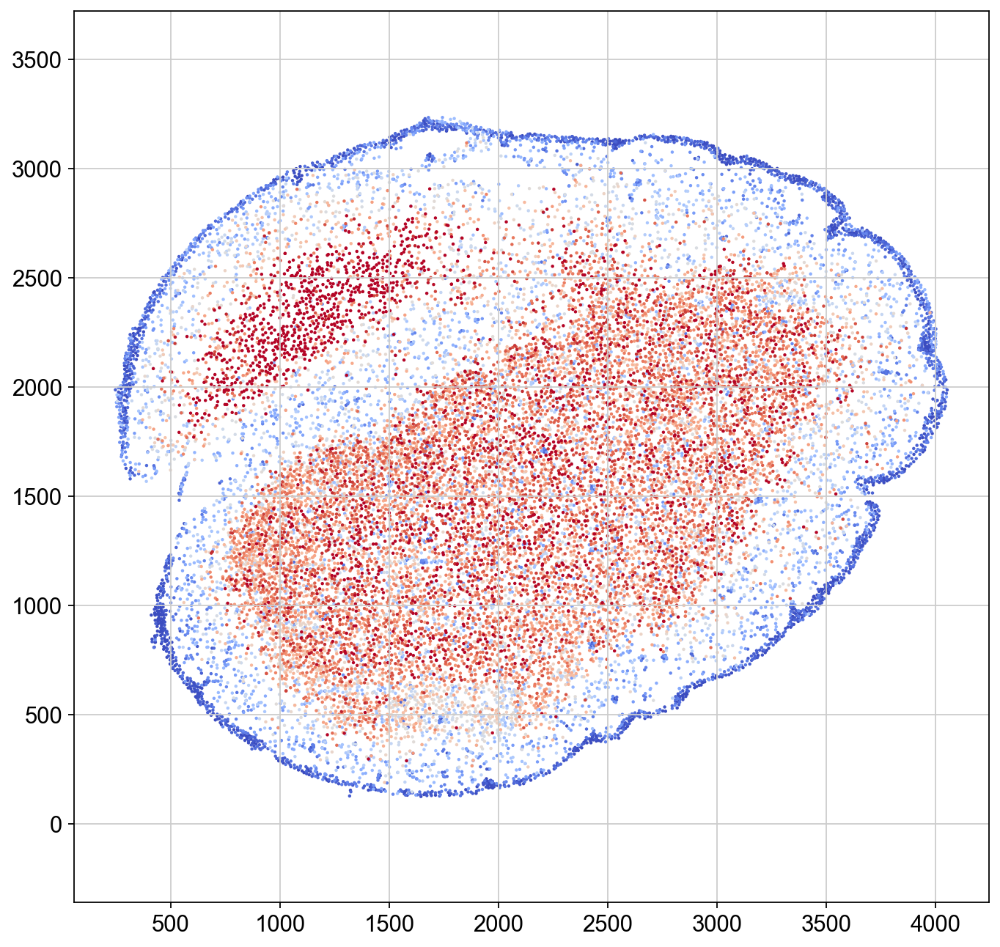

In [103]:
scdata = scdata[scdata.obs["total_counts"]>500] ### 
import matplotlib.pylab as plt
from matplotlib import cm
X_spatial = scdata.obsm['X_spatial']
Cts = np.squeeze(scdata[:,'Slc17a7'].X)
ncts = np.clip(np.exp(Cts)/550,0,1)
col = cm.coolwarm(ncts)
reorder = np.argsort(ncts)
plt.scatter(X_spatial[reorder,1],X_spatial[reorder,2],s=1,c=col[reorder])
plt.axis('equal')

In [104]:
#scdata2 = scdata2[scdata2.obs["total_counts"]>75] ### 

sc.pp.neighbors(scdata)# ,use_rep='X' #metric='correlation'
sc.tl.umap(scdata,random_state=0,min_dist=0.1)

C:\Users\miket\.conda\envs\merfishplus\lib\site-packages\scanpy\neighbors\__init__.py:577: UserWarning: You’re trying to run this on 500 dimensions of `.X`, if you really want this, set `use_rep='X'`.
         Falling back to preprocessing with `sc.pp.pca` and default params.
  x = _choose_representation(self._adata, use_rep=use_rep, n_pcs=n_pcs)


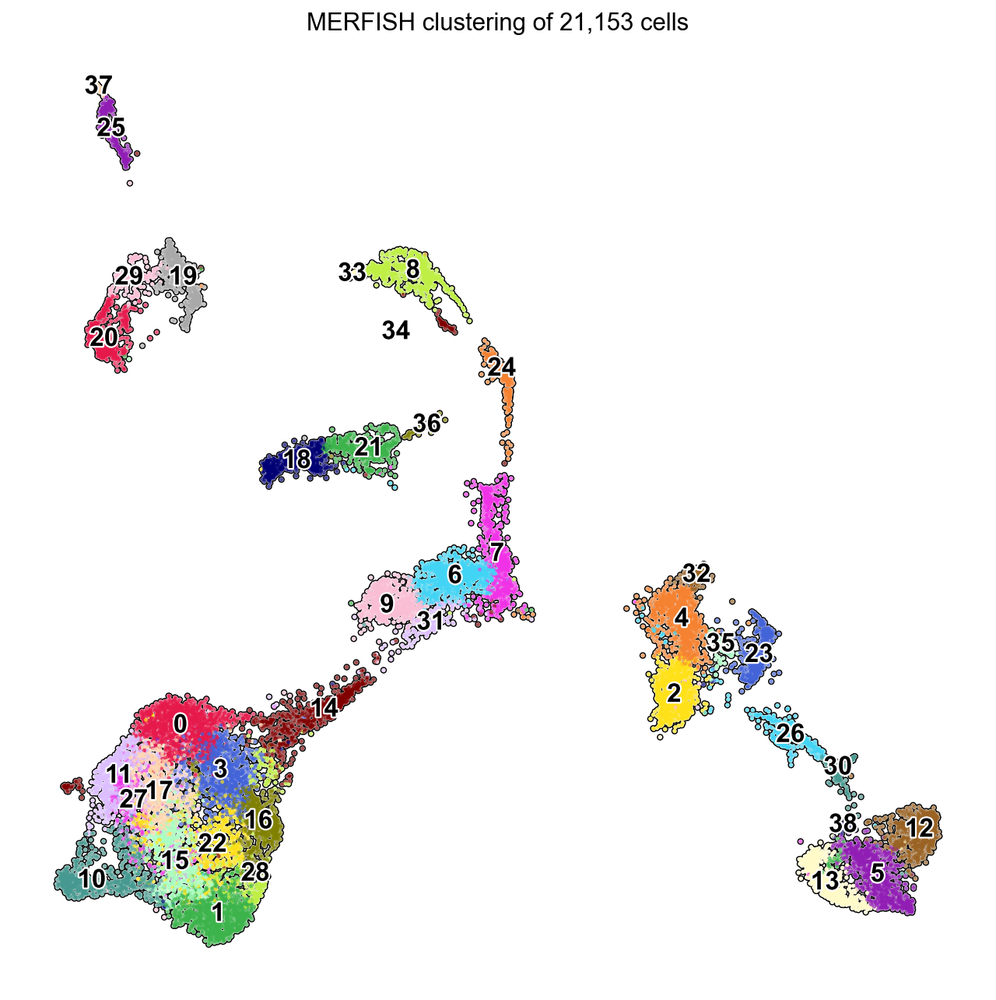

In [105]:

sc.tl.leiden(scdata, resolution=3) #### 
cmap = ["#e6194B", "#3cb44b", "#ffe119", "#4363d8", "#f58231", "#911eb4", "#42d4f4", "#f032e6", "#bfef45",
        "#fabed4", "#469990", "#dcbeff", "#9A6324", "#fffac8", "#800000", "#aaffc3", "#808000", "#ffd8b1",
        "#000075", "#a9a9a9"]
scdata.uns['cmap']=cmap
sc.set_figure_params(figsize=(10,10))
sc.pl.umap(
    scdata,
    color="leiden",
    add_outline=True,
    legend_loc="on data",
    legend_fontsize=15,
    legend_fontoutline=2,
    frameon=False,
    title=f"MERFISH clustering of {len(scdata):,d} cells",
    palette=cmap,size=20
)

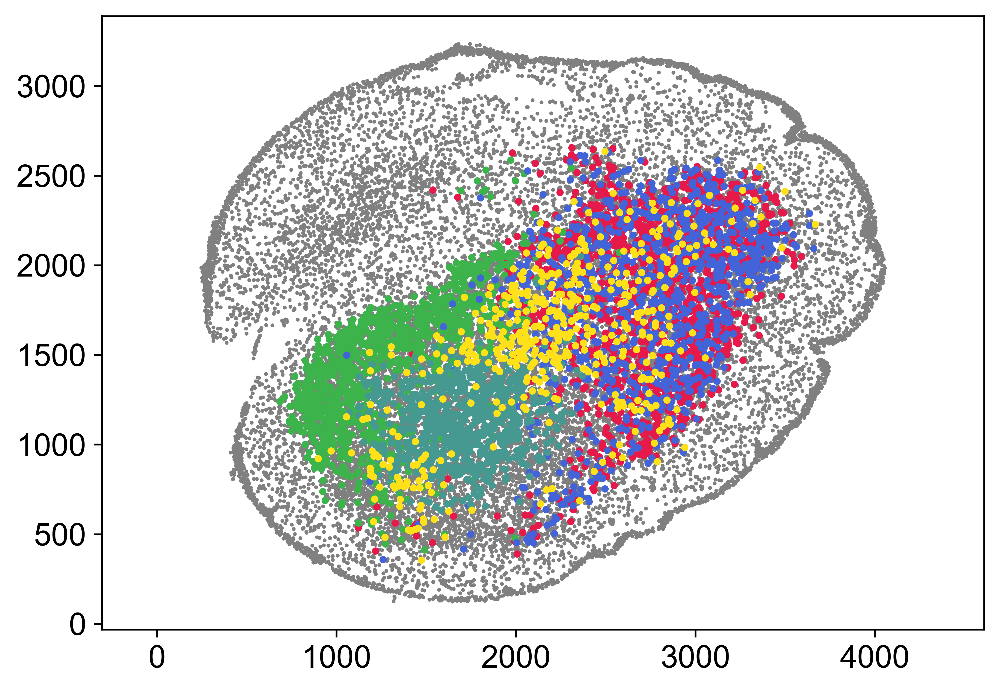

In [123]:
leiden = scdata.obs.leiden.astype(int)
X = scdata.obsm['X_spatial']
plt.figure(figsize=(7,5),dpi=300)
plt.scatter(X[:,1],X[:,2],s=0.5,c='gray')
for ul in np.unique([10,1,3,0,22]):
    c = scdata.uns['cmap'][ul%len(scdata.uns['cmap'])]
    plt.scatter(X[leiden==ul][:,1],X[leiden==ul][:,2],s=5,c=c)
plt.axis('equal')
plt.grid(False)

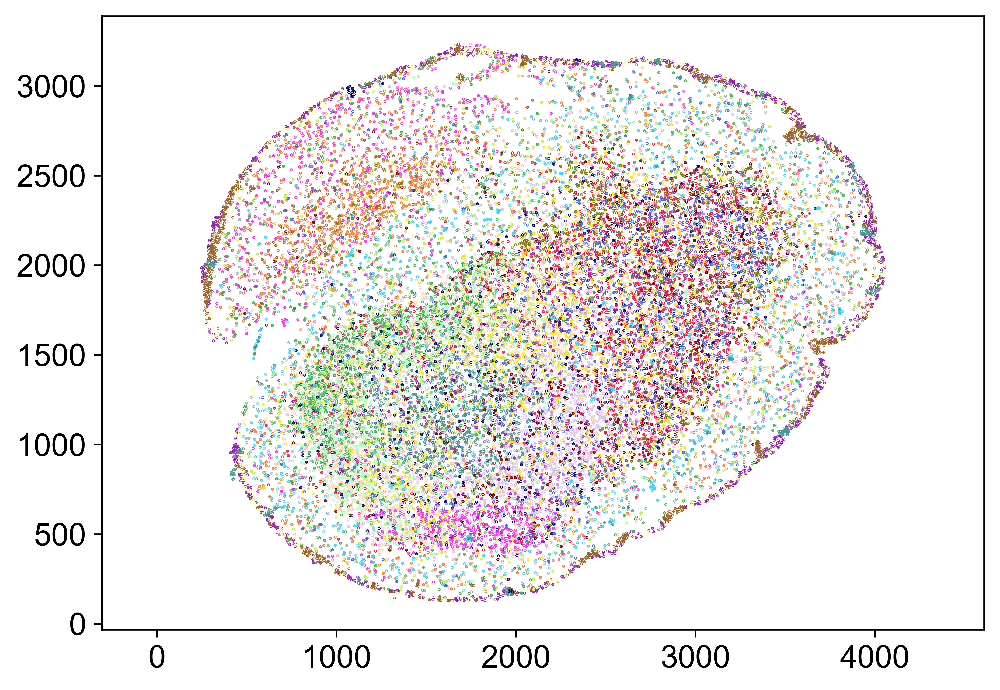

In [110]:
leiden = scdata.obs.leiden.astype(int)
X = scdata.obsm['X_spatial']
plt.figure(figsize=(7,5),dpi=300)
#plt.scatter(X[:,1],X[:,2],s=0.5,c='gray')
for ul in np.unique(leiden):
    c = scdata.uns['cmap'][ul%len(scdata.uns['cmap'])]
    plt.scatter(X[leiden==ul][:,1],X[leiden==ul][:,2],s=0.1,c=c)
plt.axis('equal')
plt.grid(False)

In [109]:
leiden = np.array(scdata.obs.leiden).astype(int)
cmap = np.array(scdata.uns['cmap'])
X = scdata.obsm['X_spatial']
col = cmap[leiden%len(cmap)]
napari.view_points(X[:,1:],border_width=0,face_color=col)

C:\Users\miket\AppData\Local\Temp\ipykernel_35364\738345965.py:5: FutureWarning: `napari.view_points` is deprecated and will be removed in napari 0.7.0.
Use `viewer = napari.Viewer(); viewer.add_points(...)` instead.
  napari.view_points(X[:,1:],border_width=0,face_color=col)


Viewer(camera=Camera(center=(0.0, np.float64(2150.2918263995666), np.float64(1679.1814904702164)), zoom=np.float64(0.18268449844258317), angles=(0.0, 0.0, 90.0), perspective=0.0, mouse_pan=True, mouse_zoom=True, orientation=(<DepthAxisOrientation.TOWARDS: 'towards'>, <VerticalAxisOrientation.DOWN: 'down'>, <HorizontalAxisOrientation.RIGHT: 'right'>)), cursor=Cursor(position=(1.0, 1.0), viewbox=None, scaled=True, style=<CursorStyle.STANDARD: 'standard'>, size=1.0), dims=Dims(ndim=2, ndisplay=2, order=(0, 1), axis_labels=('0', '1'), rollable=(True, True), range=(RangeTuple(start=np.float64(245.89849243676142), stop=np.float64(4054.6851603623722), step=np.float64(1.0)), RangeTuple(start=np.float64(124.11480484733046), stop=np.float64(3234.2481760931023), step=np.float64(1.0))), margin_left=(0.0, 0.0), margin_right=(0.0, 0.0), point=(np.float64(2149.8984924367614), np.float64(1679.1148048473306)), last_used=0), grid=GridCanvas(stride=1, shape=(-1, -1), enabled=False, spacing=0.0), layers=[

In [108]:
len(col),len(X)

(21153, 129745)

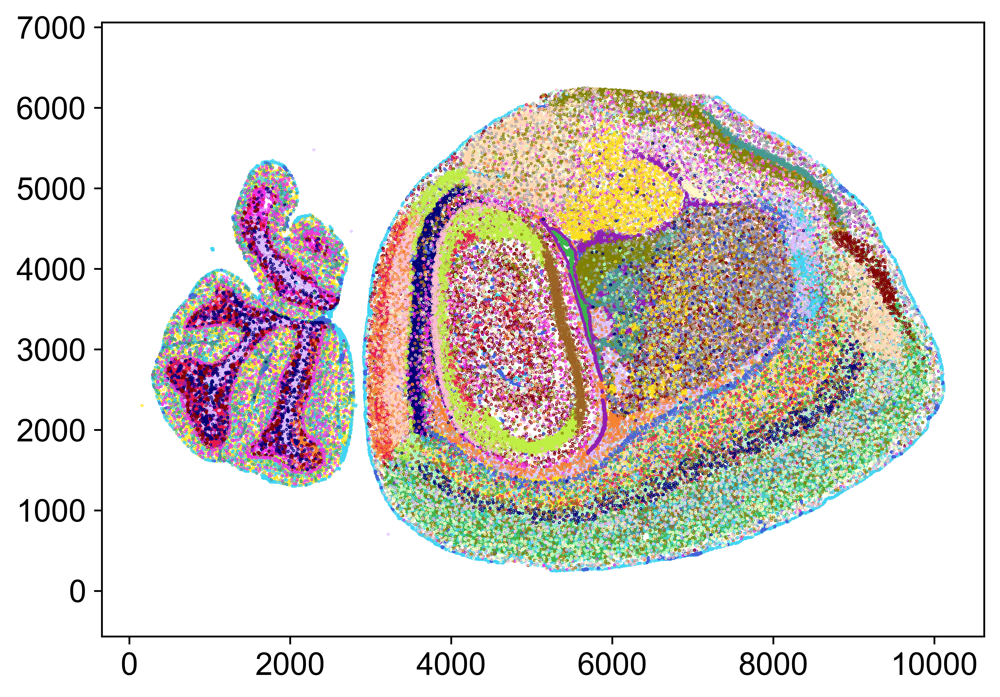

In [88]:
leiden = scdata.obs.leiden.astype(int)
X = scdata.obsm['X_spatial']
plt.figure(figsize=(7,5),dpi=300)
#plt.scatter(X[:,1],X[:,2],s=0.5,c='gray')
for ul in np.unique(leiden):
    c = scdata.uns['cmap'][ul%len(scdata.uns['cmap'])]
    plt.scatter(X[leiden==ul][:,1],X[leiden==ul][:,2],s=0.1,c=c)
plt.axis('equal')
plt.grid(False)

In [124]:
scdata.write(rf'Z:\MERFISHp\12_16_2025_BigSlideTest\ScanpyObjects\scdata_12_16_2025_set{iset}.h5ad')